# 🧽 Sponge**GAN** Squarepants 🧽

The objective of this project is to create a GAN network that is trained on frames from the television show Spongebob Squarepants. This was made for my final class project for CAP 5610. 

The dataset was the [Cartoon Classification Dataset](https://www.kaggle.com/datasets/volkandl/cartoon-classification) on Kaggle. This dataset features multiple different cartoons. I only downloaded the images related to Spongebob and compiled them all into a single file. After downloading all of the images, I center cropped each image to a size of 360 x 360.

The infastructure I used can be found at [DCGAN TUTORIAL](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html).

# Visualising the Data

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision import transforms
import torchvision
import os
import PIL
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import glob
import time
import pickle

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
ROOT_PATH = "/content/drive/MyDrive/Spongebob_Dataset"

In [ ]:
IMG_PATHS = glob.glob(ROOT_PATH + '/Frames/*')

In [ ]:
IMG_PATHS[0]

'/content/drive/MyDrive/Spongebob_Dataset/Frames/11970.jpg'

In [ ]:
len(IMG_PATHS)

12970

In [ ]:
idxs = np.random.choice(len(IMG_PATHS), 16, replace=False)

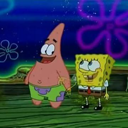

In [ ]:
# An example of how large the image will be in the output
im = Image.open(IMG_PATHS[idxs[1]])
im.resize((128,128))

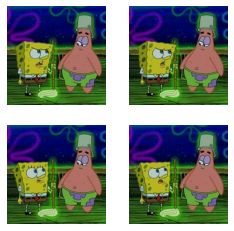

In [ ]:
# A 4x4 diagram of sample images
fig = plt.figure(figsize=(4,4))

rows = cols = 2

for i in range(4): 
    im = Image.open(IMG_PATHS[i])    
    im.resize((64,64))
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(im)
    plt.axis('off')

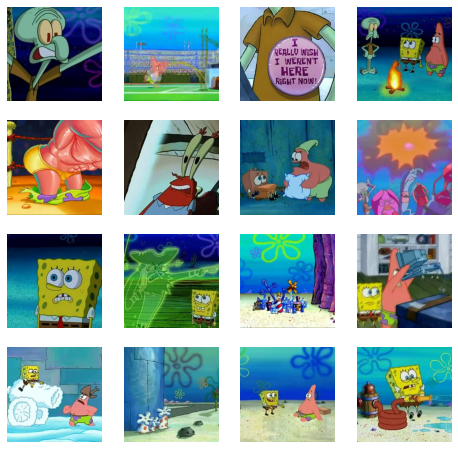

In [ ]:
# A 4x4 diagram of sample images
fig = plt.figure(figsize=(8,8))

rows = cols = 4

for i, idx in enumerate(idxs): 
    im = Image.open(IMG_PATHS[idx])    
    im.resize((64,64))
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(im)
    plt.axis('off')

# Loading the Dataset

In [ ]:
IMG_SIZE = 128
BATCH_SIZE = 16
NUM_WORKERS = 2

In [ ]:
# Loads the dataset using ImageFolder
# Resizes the image to 128x128
# Normalizes the image and converts to PyTorch tensor

ds = ImageFolder(
    root=ROOT_PATH,
    transform=transforms.Compose([
                               transforms.Resize(IMG_SIZE),
                               transforms.CenterCrop(IMG_SIZE),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])
)

In [ ]:
len(ds), ds[0][0].shape

(12970, torch.Size([3, 128, 128]))

In [ ]:
dataloader = torch.utils.data.DataLoader(
    ds, 
    batch_size=BATCH_SIZE,
    shuffle=True, 
    num_workers=NUM_WORKERS
)

# Model Definitions

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
# If there is a saved model, then load that one
IS_SAVE = True
SAVED_ROOT = "/content/drive/MyDrive/Saved_GAN/SAVE_14"

In [ ]:
# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of channels
nc = 3

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002 

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [ ]:
# Courtesy of:
# https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
# Courtesy of: 
# https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 16, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 16),
            nn.ReLU(True),
            # state size. (ngf*16) x 4 x 4
            nn.ConvTranspose2d( ngf * 16, ngf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d( ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
model = Generator(1)
model(torch.ones((16,100,1,1))).shape

torch.Size([16, 3, 128, 128])

In [ ]:
# Courtesy of:
# https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

if IS_SAVE:
    print("Loading Generator Save...")
    netG.load_state_dict(torch.load(os.path.join(SAVED_ROOT, "netG.pt")))
    netG.train()

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
else:
    netG.apply(weights_init)

# Print the model
print(netG)

Loading Generator Save...
Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bi

In [ ]:
# Courtesy of:
# https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 8, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 8, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 8, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 8, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
model = Discriminator(1)
from torchsummary import summary

model(torch.ones((16,3,128,128))).shape

torch.Size([16, 1, 1, 1])

In [ ]:
# Courtesy of:
# https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

if IS_SAVE:
    print("Loading Discriminator Save...")
    netD.load_state_dict(torch.load(os.path.join(SAVED_ROOT, "netD.pt")))
    netD.train()

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
else:
    netD.apply(weights_init)

# Print the model
print(netD)

Loading Discriminator Save...
Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(8, 8), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(8, 8), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(8, 8), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(8, 8), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [ ]:
# Courtesy of:
# https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# Load Saved Optimizer

if IS_SAVE:
    print("Loading Optimizers...")
    optimizerD.load_state_dict(torch.load(os.path.join(SAVED_ROOT, "optimizerD.pt")))
    optimizerG.load_state_dict(torch.load(os.path.join(SAVED_ROOT, "optimizerG.pt")))

Loading Optimizers...


# Load Data

# Training Loop

In [ ]:
if IS_SAVE:
    with open(os.path.join(SAVED_ROOT, "img_list"), "rb") as fp:
        img_list = pickle.load(fp)
    with open(os.path.join(SAVED_ROOT, "G_losses"), "rb") as fp:
        G_losses = pickle.load(fp)
    with open(os.path.join(SAVED_ROOT, "D_losses"), "rb") as fp:
        D_losses = pickle.load(fp)

# os.path.join(SAVED_ROOT, "img_list")

In [ ]:
len(img_list), len(G_losses), len(D_losses)

(14, 5677, 5677)

In [ ]:
SAVE_PATH = "/content/drive/MyDrive/Saved_GAN"

In [ ]:
os.path.join(SAVED_ROOT, "img_list") 

'/content/drive/MyDrive/Saved_GAN/SAVE_4/img_list'

In [ ]:
# The epoch number that the model should save at
SAVE_EPOCH = 0

In [ ]:
# Courtesy of:
# https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

# Lists to keep track of progress

if not IS_SAVE:
    img_list = []
    G_losses = []
    D_losses = []

iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()
        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(torchvision.utils.make_grid(fake, padding=2, normalize=True))

        iters += 1

    # Save every epoch
    # Create a new directory for the save

    save_num = len(os.listdir(SAVE_PATH))
    dir_name = f"SAVE_{save_num + 1}"
    dir_path = os.path.join(SAVE_PATH, dir_name)
    os.mkdir(dir_path)
    
    # Save the Generator, Discriminator, and the two Optimizers

    torch.save(netG.state_dict(), os.path.join(dir_path, "netG.pt"))
    torch.save(netD.state_dict(), os.path.join(dir_path, "netD.pt"))
    torch.save(optimizerG.state_dict(), os.path.join(dir_path, "optimizerG.pt"))
    torch.save(optimizerD.state_dict(), os.path.join(dir_path, "optimizerD.pt"))

    with open(os.path.join(dir_path, "img_list") , "wb") as fp:
        pickle.dump(img_list, fp)
    with open(os.path.join(dir_path, "G_losses") , "wb") as fp:
        pickle.dump(G_losses, fp)
    with open(os.path.join(dir_path, "D_losses") , "wb") as fp:
        pickle.dump(D_losses, fp)

# Save data after training is finished

# Create new directory

# save_num = len(os.listdir(SAVE_PATH))
# dir_name = f"SAVE_{save_num + 1}"
# dir_path = os.path.join(SAVE_PATH, dir_name)
# os.mkdir(dir_path)

# # Save the Generator, Discriminator, and the two Optimizers

# torch.save(netG.state_dict(), os.path.join(dir_path, "netG.pt"))
# torch.save(netD.state_dict(), os.path.join(dir_path, "netD.pt"))
# torch.save(optimizerG.state_dict(), os.path.join(dir_path, "optimizerG.pt"))
# torch.save(optimizerD.state_dict(), os.path.join(dir_path, "optimizerD.pt"))

# with open("/content/drive/MyDrive/img_list", "wb") as fp:
#             pickle.dump(img_list, fp)
# with open("/content/drive/MyDrive/G_losses", "wb") as fp:
#     pickle.dump(G_losses, fp)
# with open("/content/drive/MyDrive/D_losses", "wb") as fp:
#     pickle.dump(D_losses, fp)

Starting Training Loop...
[0/5][0/811]	Loss_D: 0.6435	Loss_G: 7.7114	D(x): 0.7718	D(G(z)): 0.1383 / 0.0014
[0/5][50/811]	Loss_D: 0.1762	Loss_G: 8.2538	D(x): 0.9900	D(G(z)): 0.1181 / 0.0014
[0/5][100/811]	Loss_D: 0.0365	Loss_G: 6.8752	D(x): 0.9896	D(G(z)): 0.0233 / 0.0035
[0/5][150/811]	Loss_D: 0.0417	Loss_G: 5.2014	D(x): 0.9925	D(G(z)): 0.0329 / 0.0088
[0/5][200/811]	Loss_D: 0.0404	Loss_G: 6.7984	D(x): 0.9971	D(G(z)): 0.0308 / 0.0024
[0/5][250/811]	Loss_D: 0.0854	Loss_G: 5.6046	D(x): 0.9925	D(G(z)): 0.0663 / 0.0061
[0/5][300/811]	Loss_D: 0.0358	Loss_G: 5.6832	D(x): 0.9812	D(G(z)): 0.0162 / 0.0063
[0/5][350/811]	Loss_D: 0.0150	Loss_G: 5.6326	D(x): 0.9953	D(G(z)): 0.0102 / 0.0069
[0/5][400/811]	Loss_D: 0.0058	Loss_G: 6.4323	D(x): 0.9982	D(G(z)): 0.0040 / 0.0030
[0/5][450/811]	Loss_D: 0.4542	Loss_G: 8.9734	D(x): 0.9970	D(G(z)): 0.2947 / 0.0006
[0/5][500/811]	Loss_D: 0.0392	Loss_G: 8.0488	D(x): 0.9687	D(G(z)): 0.0066 / 0.0031
[0/5][550/811]	Loss_D: 0.0507	Loss_G: 5.6244	D(x): 0.9982	D(G(z)

KeyboardInterrupt: ignored

In [ ]:
model = Generator(1)
model.load_state_dict(torch.load("/content/drive/MyDrive/Saved_GAN/SAVE_14/netG.pt"))
model.eval()

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): BatchN

In [ ]:
noise = torch.randn(1, nz, 1, 1, device=device)
out = model(noise)

im = out.squeeze().detach().numpy()
im = np.rollaxis(im, 0, im.ndim)

im.shape
plt.imshow(im)
plt.axis('off')

NameError: ignored

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(3, 128, 128)
(3, 128, 128)
(3, 128, 128)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(3, 128, 128)
(3, 128, 128)
(3, 128, 128)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(3, 128, 128)
(3, 128, 128)
(3, 128, 128)
(3, 128, 128)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(3, 128, 128)
(3, 128, 128)


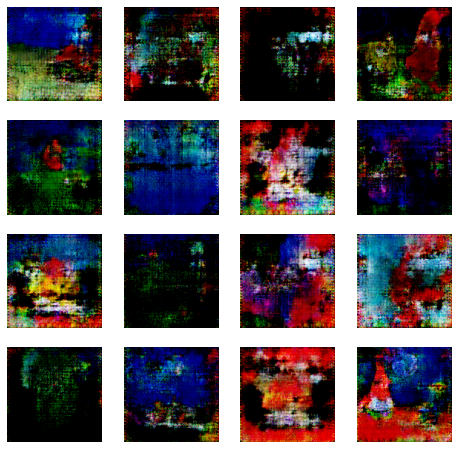

In [ ]:
# A 4x4 diagram of sample images
fig = plt.figure(figsize=(8,8))

rows = cols = 4

for i in range(16): 
    noise = torch.randn(1, nz, 1, 1, device=device)
    out = model(noise)

    im = out.squeeze().detach().numpy()
    print(im.shape)
    im = np.rollaxis(im, 0, im.ndim)
 
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(im)
    plt.axis('off')

In [ ]:
len(G_losses)

5677

Text(0, 0.5, 'Loss')

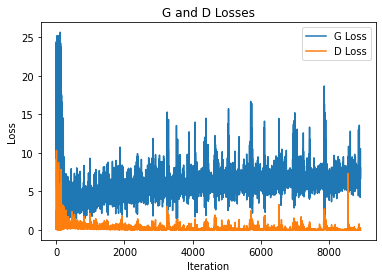

In [ ]:
plt.plot(G_losses, label='G Loss')
plt.plot(D_losses, label='D Loss')
plt.legend()
plt.title("G and D Losses")
plt.xlabel("Iteration")
plt.ylabel("Loss")

In [ ]:
np.min(G_losses) 

0.8747966289520264

In [ ]:
np.min(D_losses) 

0.0019772695377469063

In [ ]:
len(img_list)

21

In [ ]:
img_list[0].shape

torch.Size([3, 1042, 1042])

(-0.5, 261.5, 261.5, -0.5)

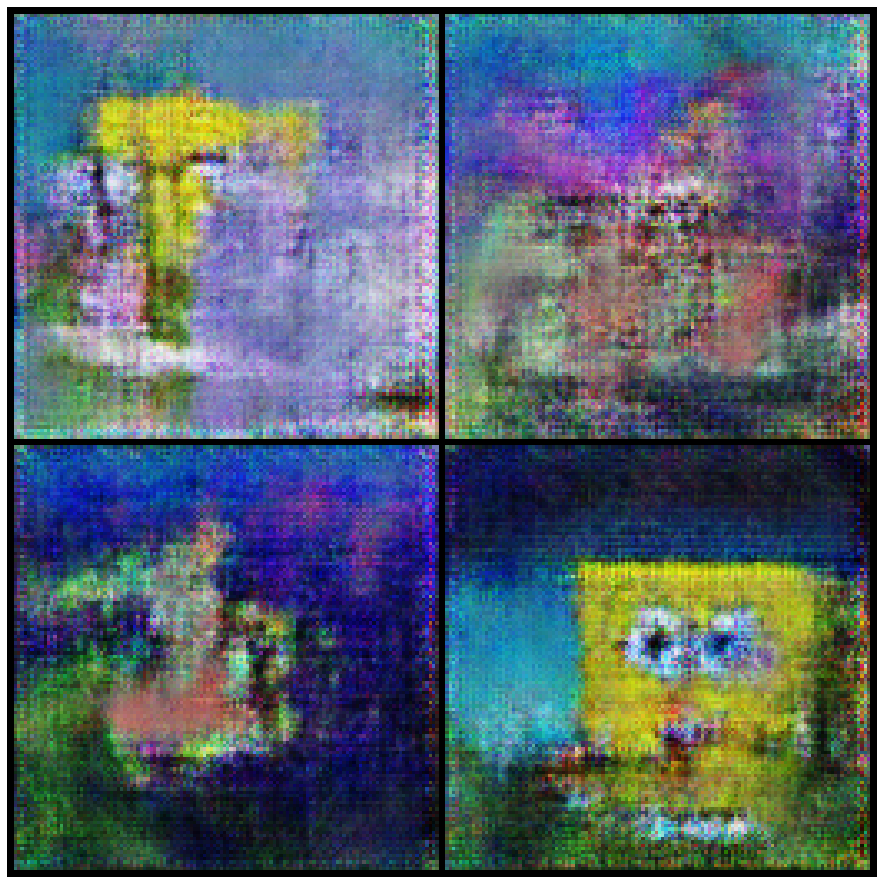

In [ ]:
fig = plt.figure(figsize=(16,16))

image = img_list[-1].numpy()
image = np.rollaxis(image, 0, image.ndim)
image = image[0:(128*2) + 6,0:(128 * 2) + 6,:]

plt.imshow(image)
plt.axis('off')

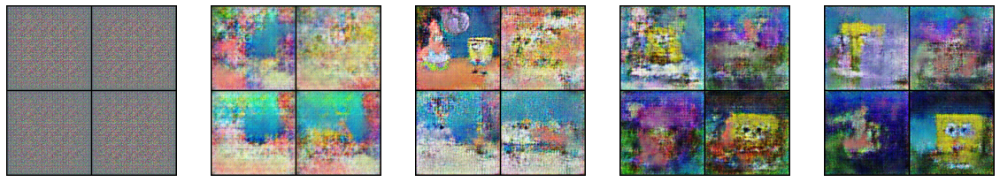

In [ ]:
fig = plt.figure(figsize=(20,20))

idxs = [0,5,10,15,20]

rows = 1
cols = 5

for x, i in enumerate(idxs):
    im = img_list[i].numpy()
    im = np.rollaxis(im, 0, im.ndim)
    im = im[0:(128*2) + 6,0:(128 * 2) + 6,:]
    fig.add_subplot(rows, cols, x+1)
    
    plt.imshow(im)
    plt.axis('off')

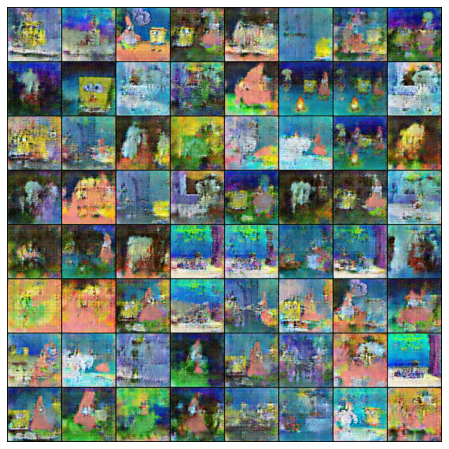

In [ ]:
# Courtesy of:
# https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

import matplotlib.animation as animation
from IPython.display import HTML

fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())